# Homework #2
#### Nikita Ravi (ravi30)

## Logic

The transformation of a homogenous point in the domain $\vec{x}$ to a homogeneous point in the range $\vec{x'}$ is given by $\vec{x'} = H\vec{x}$ where the matrix $H$ is a $3\times3$ matrix and it represents a linear mapping from one homogeneous coordinate to another in different planes of the same dimension. 


The matrix H can be expressed as
$\begin{bmatrix}
h_{11} & h_{12} & h_{13} \\
h_{21} & h_{22} & h_{23} \\
h_{31} & h_{32} & h_{33} \\
\end{bmatrix}$

Therefore, using the relation mentioned above the homogeneous point in the range is given by: 



$x_1' = h_{11}x_1 + h_{12}x_2 + h_{13}x_3$ 

$x_2' = h_{21}x_1 + h_{22}x_2 + h_{23}x_3$ 

$x_3' = h_{31}x_1 + h_{32}x_2 + h_{33}x_3$

To obtain the coordinates in the range on the real plane, we have to divide the first two coordinates of the homogeneous coordinate by the third coordinate, thus giving

$x' = \frac{x_1'}{x_3'} = \frac{h_{11}x_1 + h_{12}x_2 + h_{13}x_3}{h_{31}x_1 + h_{32}x_2 + h_{33}x_3}$ and 
$y' = \frac{x_2'}{x_3'} = \frac{h_{21}x_1 + h_{22}x_2 + h_{23}x_3}{h_{31}x_1 + h_{32}x_2 + h_{33}x_3}$


We can simplify the $x'$ and $y'$ coordinate to also include the actual coordinates in the domain on the real plane by dividing the RHS by $x_3$ as shown below

$x' = \frac{h_{11}x + h_{12}y + h_{13}}{h_{31}x + h_{32}y + h_{33}}$ and $y' = \frac{h_{21}x + h_{22}y + h_{23}}{h_{31}x + h_{32}y + h_{33}}$

We make the above two $x'$ and $y'$ equations into a system of linear equations:

$h_{11}x + h_{12}y + h_{13} - h_{31}xx' - h_{32}yx' - h_{33}x' = 0$

$h_{21}x + h_{22}y + h_{23} - h_{31}xy' - h_{32}yy' - h_{33}y' = 0$

Because there are 9 unknowns, we will have eight system of linear equations representing 4 different homogenous points. This can be represented in matrix form $A\vec{h} = \vec{b}$

$\begin{bmatrix}
x_1 & y_1 & 1 & 0 & 0 & 0 & -x_1x_1' & -y_1x_1' \\
0 & 0 & 0 & x_1 & y_1 & 1 & -x_1y_1' &  -y_1y_1' \\
x_2 & y_2 & 1 & 0 & 0 & 0 & -x_2x_2' & -y_2x_2' \\
0 & 0 & 0 & x_2 & y_2 & 1 & -x_2y_2' &  -y_2y_2' \\
x_3 & y_3 & 1 & 0 & 0 & 0 & -x_3x_3' & -y_3x_3' \\
0 & 0 & 0 & x_3 & y_3 & 1 & -x_3y_3' &  -y_3y_3' \\
x_4 & y_4 & 1 & 0 & 0 & 0 & -x_4x_4' & -y_4x_4' \\
0 & 0 & 0 & x_4 & y_4 & 1 & -x_4y_4' &  -y_4y_4' \\
\end{bmatrix} \begin{bmatrix}
h_{11} \\ 
h_{12} \\
h_{13} \\
h_{21} \\
h_{22} \\
h_{23} \\
h_{31} \\
h_{32} \\ \end{bmatrix} = \begin{bmatrix}
x_1' \\
y_1' \\
x_2' \\
y_2' \\
x_3' \\
y_3' \\
x_4' \\
y_4' \\ \end{bmatrix}$ 

and therefore, $\vec{h}$ is calculated by $A^{-1}\vec{b}$

For an affine transformation, $h_{31} = 0$, $h_{32} = 0$, and $h_{33} = 1$ so we are dealing with three different distinct homogenous points instead of four like above. So the matrix representation $A\vec{h} = \vec{b}$ is given by

$\begin{bmatrix}
x_1 & y_1 & 1 & 0 & 0 & 0 \\
0 & 0 & 0 & x_1 & y_1 & 1 \\
x_2 & y_2 & 1 & 0 & 0 & 0 \\
0 & 0 & 0 & x_2 & y_2 & 1 \\
x_3 & y_3 & 1 & 0 & 0 & 0 \\
0 & 0 & 0 & x_3 & y_3 & 1 \\ \end{bmatrix} 
\begin{bmatrix}
h_{11} \\
h_{12} \\
h_{13} \\
h_{21} \\
h_{22} \\
h_{23} \end{bmatrix} = \begin{bmatrix}
x_1' \\
y_1' \\
x_2' \\
y_2' \\
x_3' \\
y_3' \\ \end{bmatrix}$

For this assignment, I chose the corners of each image as my distinct homogeneous points since they don't fit one linear line

## Code

In [1]:
import numpy as np
import cv2

### Functions

In [2]:
def compute_homography(warped, original):
    n = warped.shape[1]
    A = np.zeros((2*n, 2*n))
    b = np.zeros((2*n, 1))
    H = np.zeros((3,3))

    for idx in range(n):
        A[2*idx] = [original[0][idx], original[1][idx], 1, 0, 0, 0, (-original[0][idx] * warped[0][idx]), (-original[1][idx] * warped[0][idx])]
        A[2*idx + 1] = [0, 0, 0, original[0][idx], original[1][idx], 1, (-original[0][idx] * warped[1][idx]), (-original[1][idx] * warped[1][idx])]
        b[2*idx] = warped[0][idx]
        b[2*idx + 1] = warped[1][idx]

    h = np.matmul(np.linalg.inv(A), b)

    row = 0
    for idx in range(0, len(h), 3):
        spliced = h[idx:idx+3]
        if(len(spliced) == 3):
            H[row] = spliced.T
        else:
            H[row] = np.append(spliced, [1])
        row += 1

    return H

In [3]:
def transform(warped, original, H, path):
    original_height, original_width, original_channel = original.shape
    warped_height, warped_width, warped_channel = warped.shape

    for h in range(warped_height):
        for w in range(warped_width):
            Xprime = np.array((w, h, 1))
            X = np.matmul(np.linalg.inv(H), Xprime.T)
            X = X / X[2]
            X = X.astype(int)

            if(X[0] < original_height and X[0] > 0 and X[1] < original_width and X[1] > 0):
                warped[h][w] = original[X[0]][X[1]]

    cv2.imwrite(path, warped)

In [4]:
def affine_homography(warped, original):
    n = warped.shape[1]
    A = np.zeros((2*n, 2*n))
    b = np.zeros((2*n, 1))
    H = np.zeros((2,3))
    
    for idx in range(n):
        A[2*idx] = [original[0][idx], original[1][idx], 1, 0, 0, 0]
        A[2*idx + 1] = [0, 0, 0, original[0][idx], original[1][idx], 1]
        b[2*idx] = warped[0][idx]
        b[2*idx + 1] = warped[1][idx]

    h = np.matmul(np.linalg.inv(A), b)
    row = 0
    for idx in range(0, len(h), 3):
        spliced = h[idx:idx+3]
        H[row] = spliced.T
        row += 1

    H = np.vstack([H, [0,0,1]])
    return H

### TASK 1

#### Task 1a

In [5]:
car = cv2.imread("hw2images/car.jpg")
card1 = cv2.imread("hw2images/card1.jpeg")
card2 = cv2.imread("hw2images/card2.jpeg")
card3 = cv2.imread("hw2images/card3.jpeg")

In [6]:
## The four points on the car
car_points = np.array([[0,0,1], [0,car.shape[1],1], [car.shape[0], car.shape[1], 1], [car.shape[0], 0, 1]])

## The four points on card1
# x1, y1 = 488, 252
# x2, y2 = 612, 1115
# x3, y3 = 1222, 802
# x4, y4 = 1242, 178
card1_points = np.array([[488,252,1], [612,1115,1], [1222,802,1], [1242,178,1]])

## The four points on card2
# x1, y1 = 319, 232
# x2, y2 = 211, 868
# x3, y3 = 876, 1129
# x4, y4 = 1045, 233
card2_points = np.array([[319,232,1], [211,868,1], [876,1133,1], [1045,233,1]])

## The four points on card3
# x1, y1 = 587, 46
# x2, y2 = 62, 594
# x3, y3 = 703, 1213
# x4, y4 = 1228, 679
card3_points = np.array([[587,46,1], [62,594,1], [703,1213,1], [1228,679,1]])

In [7]:
H_card1 = compute_homography(card1_points.T, car_points.T)
H_card2 = compute_homography(card2_points.T, car_points.T)
H_card3 = compute_homography(card3_points.T, car_points.T)

In [8]:
transform(card1, car, H_card1, "task1a/card1_transform.jpg")

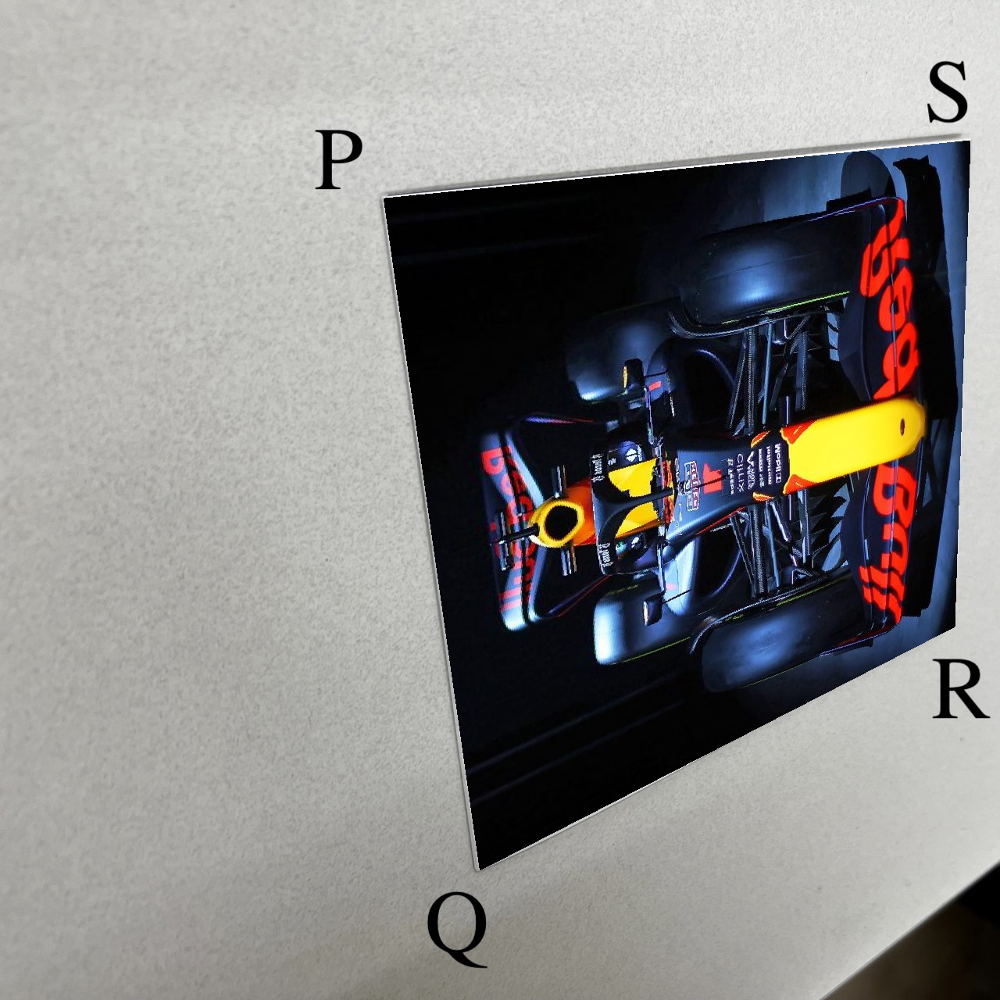

In [9]:
transform(card2, car, H_card2, "task1a/card2_transform.jpg")

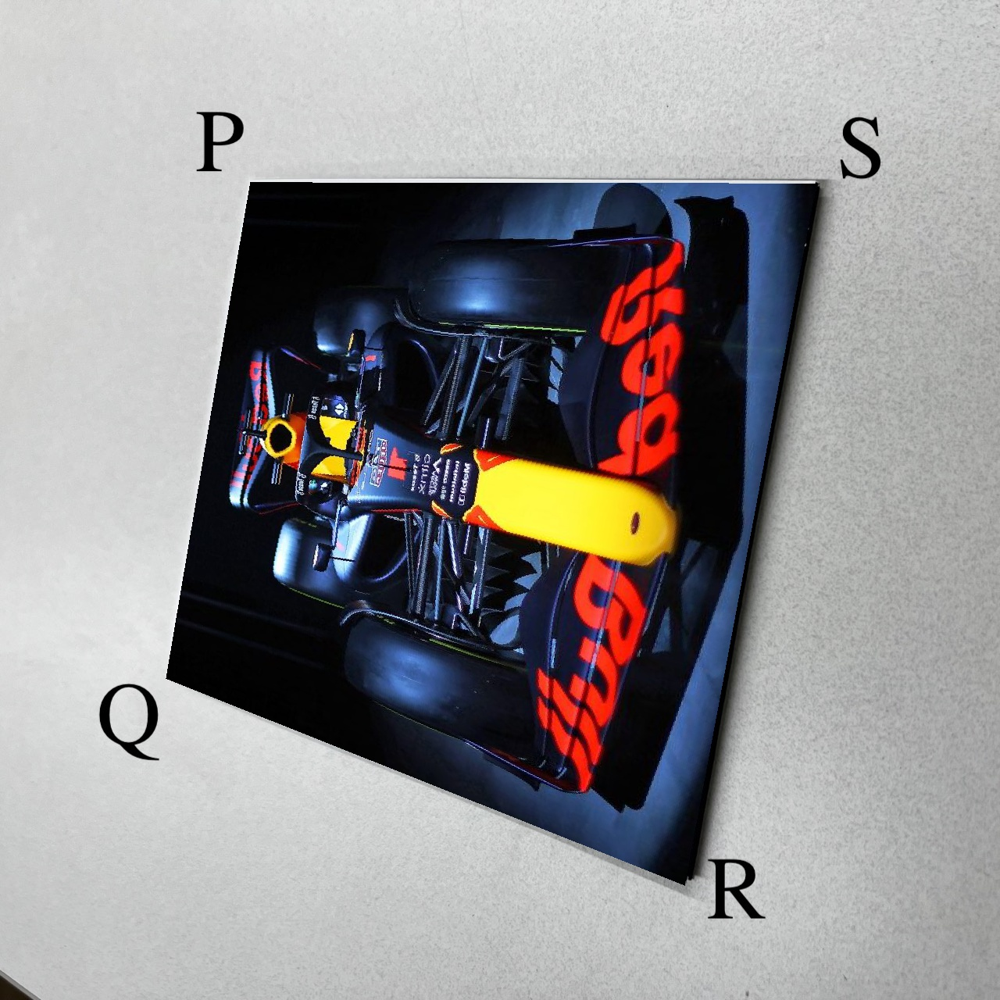

In [10]:
transform(card3, car, H_card3, "task1a/card3_transform.jpg")

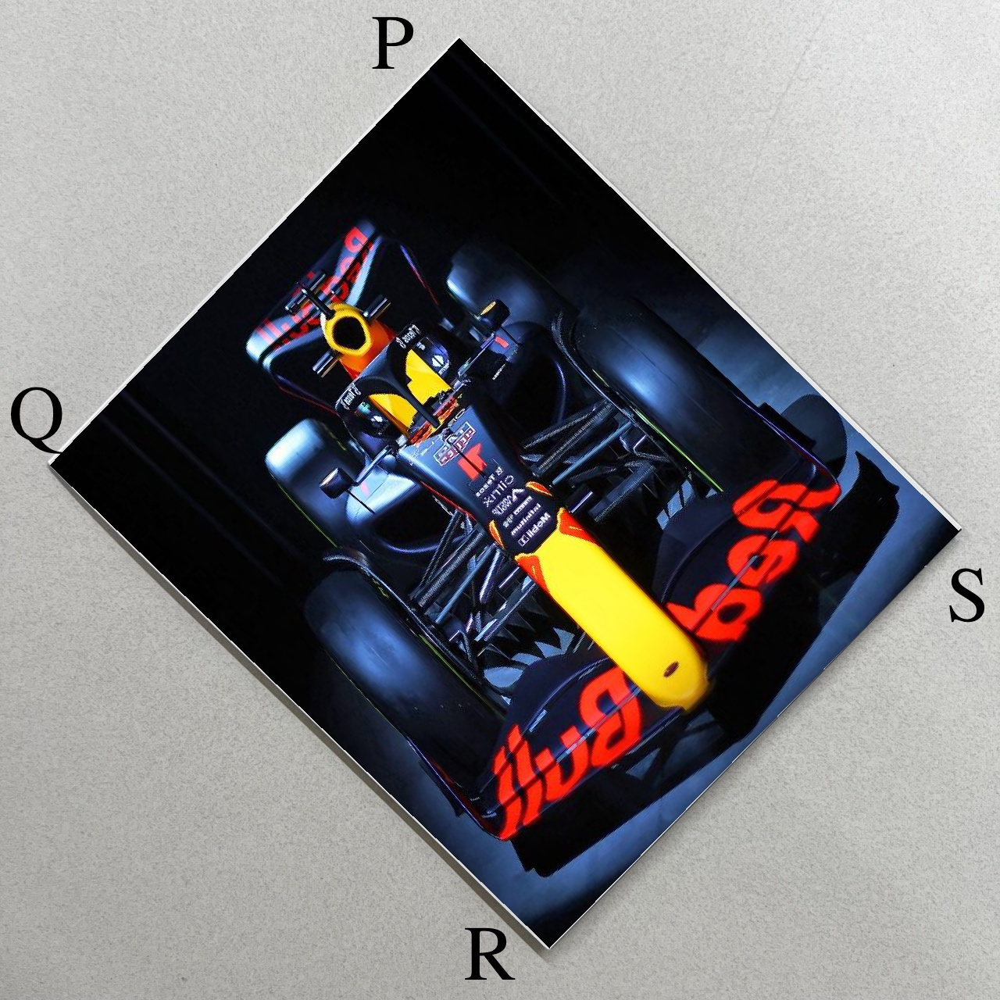

#### Task 1b

In [11]:
car = cv2.imread("hw2images/car.jpg")
card1 = cv2.imread("hw2images/card1.jpeg")
card2 = cv2.imread("hw2images/card2.jpeg")
card3 = cv2.imread("hw2images/card3.jpeg")

In [12]:
## The four points on the car
car_points = np.array([[0,0,1], [0,car.shape[1],1], [car.shape[0], car.shape[1], 1], [car.shape[0], 0, 1]])

## The four points on card1
# x1, y1 = 488, 252
# x2, y2 = 612, 1115
# x3, y3 = 1222, 802
# x4, y4 = 1242, 178
card1_points = np.array([[488,252,1], [612,1115,1], [1222,802,1], [1242,178,1]])

## The four points on card2
# x1, y1 = 319, 232
# x2, y2 = 211, 868
# x3, y3 = 876, 1129
# x4, y4 = 1045, 233
card2_points = np.array([[319,232,1], [211,868,1], [876,1133,1], [1045,233,1]])

## The four points on card3
# x1, y1 = 587, 46
# x2, y2 = 62, 594
# x3, y3 = 703, 1213
# x4, y4 = 1228, 679
card3_points = np.array([[587,46,1], [62,594,1], [703,1213,1], [1228,679,1]])

In [13]:
H21 = compute_homography(card2_points.T, card1_points.T)
H32 = compute_homography(card3_points.T, card2_points.T)
H32_21 = np.matmul(H32, H21)

In [14]:
blank_image = np.zeros(card3.shape)
transform(blank_image, card1, H32_21, "task1b/card1_transformed.jpg")

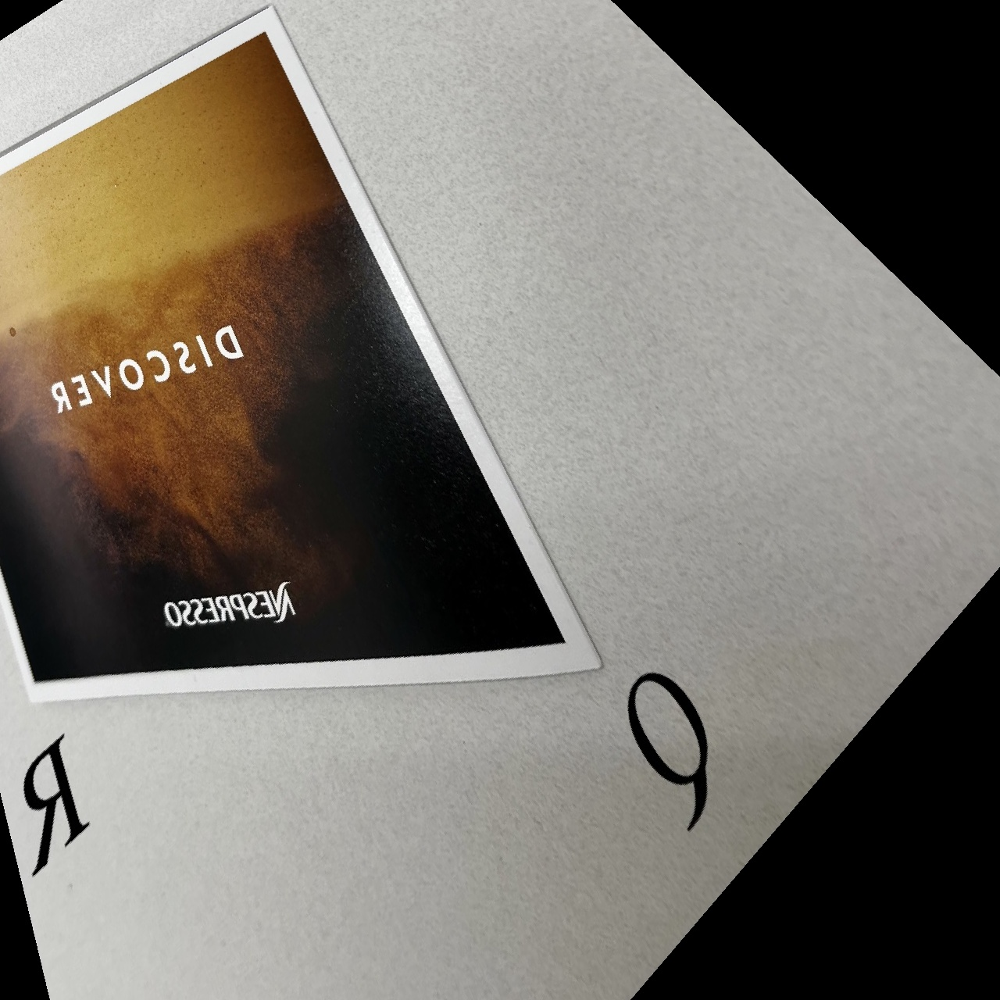

#### Task 1c

In [15]:
car = cv2.imread("hw2images/car.jpg")
card1 = cv2.imread("hw2images/card1.jpeg")
card2 = cv2.imread("hw2images/card2.jpeg")
card3 = cv2.imread("hw2images/card3.jpeg")

In [16]:
## The four points on the car
car_points = np.array([[0,0,1], [0,car.shape[1],1], [car.shape[0], car.shape[1], 1], [car.shape[0], 0, 1]])

## The four points on card1
# x1, y1 = 488, 252
# x2, y2 = 612, 1115
# x3, y3 = 1222, 802
# x4, y4 = 1242, 178
card1_points = np.array([[488,252,1], [612,1115,1], [1222,802,1]])

## The four points on card2
# x1, y1 = 319, 232
# x2, y2 = 211, 868
# x3, y3 = 876, 1129
# x4, y4 = 1045, 233
card2_points = np.array([[319,232,1], [211,868,1], [876,1133,1]])

## The four points on card3
# x1, y1 = 587, 46
# x2, y2 = 62, 594
# x3, y3 = 703, 1213
# x4, y4 = 1228, 679
card3_points = np.array([[587,46,1], [62,594,1], [703,1213,1]])

In [17]:
affine_1 = affine_homography(card1_points, car_points)
affine_2 = affine_homography(card2_points, car_points)
affine_3 = affine_homography(card3_points, car_points)

In [18]:
transform(card1, car, affine_1, "task1c/card1_affine.jpg")

In [19]:
transform(card2, car, affine_2, "task1c/card2_affine.jpg")

In [20]:
transform(card3, car, affine_3, "task1c/card3_affine.jpg")

### TASK 2

Input Images:
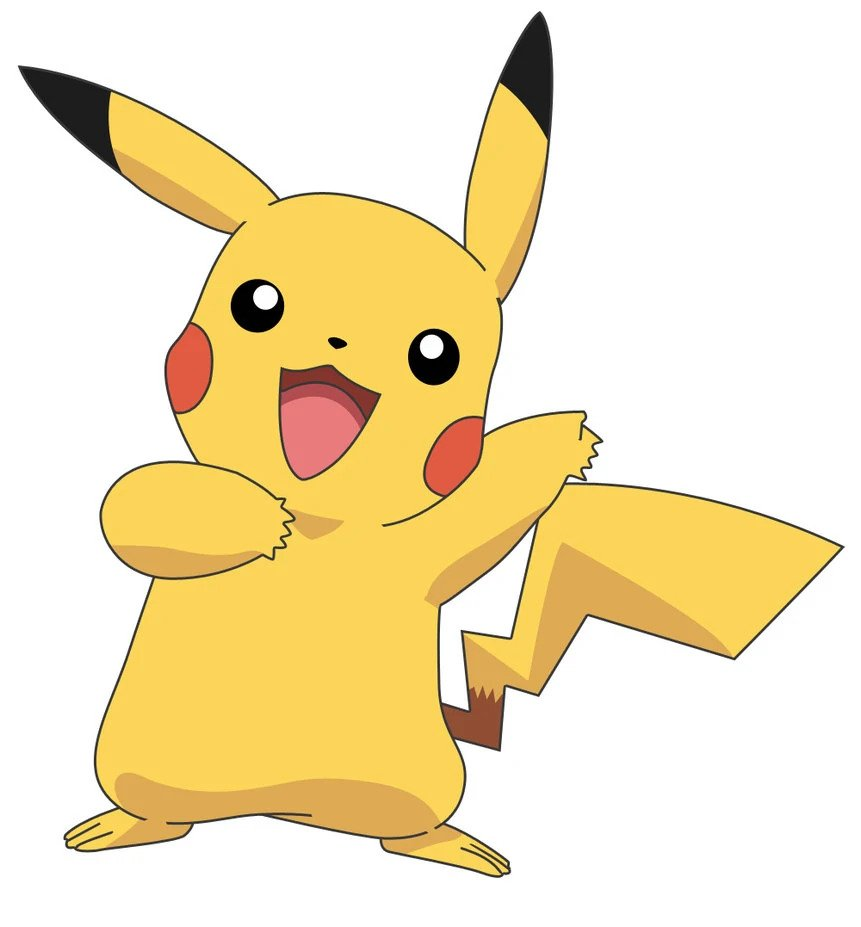

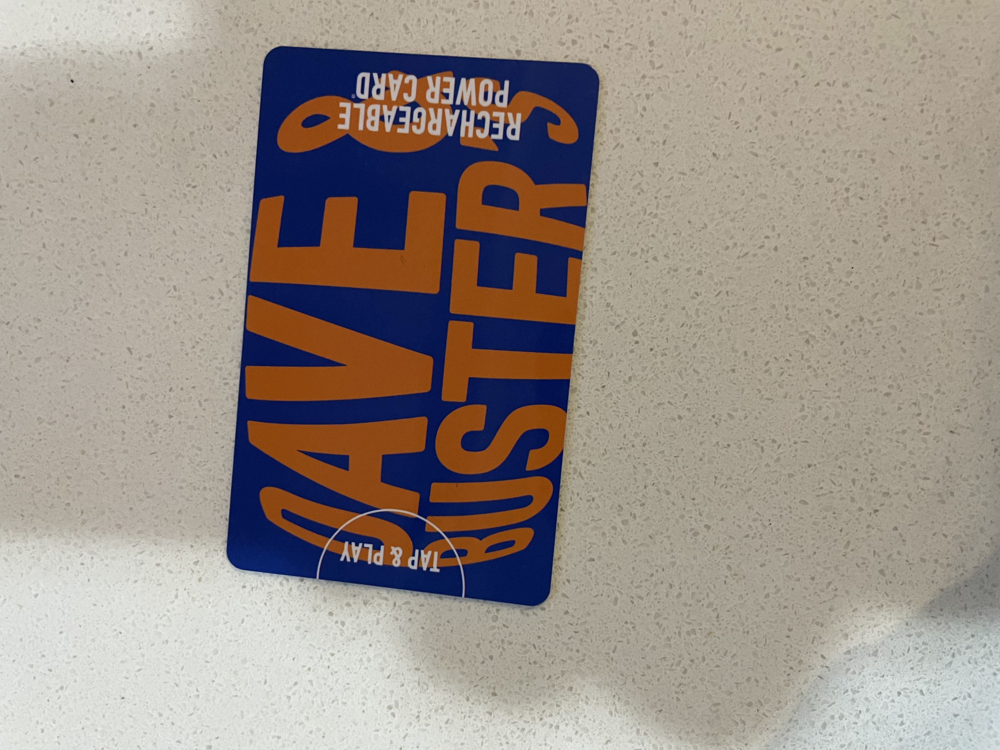

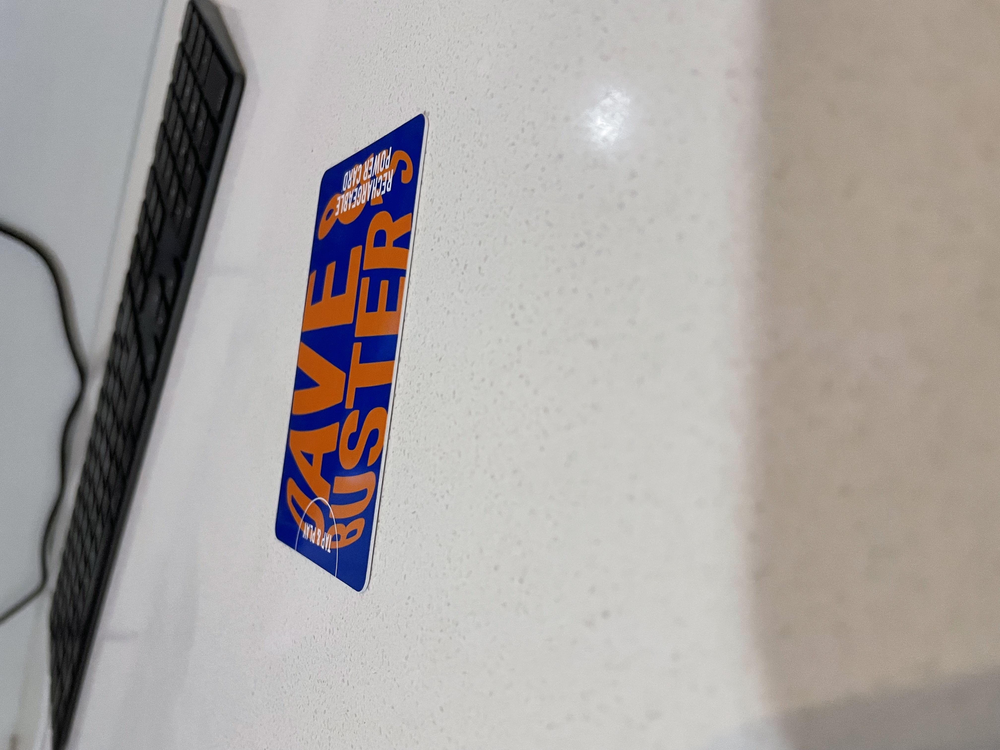

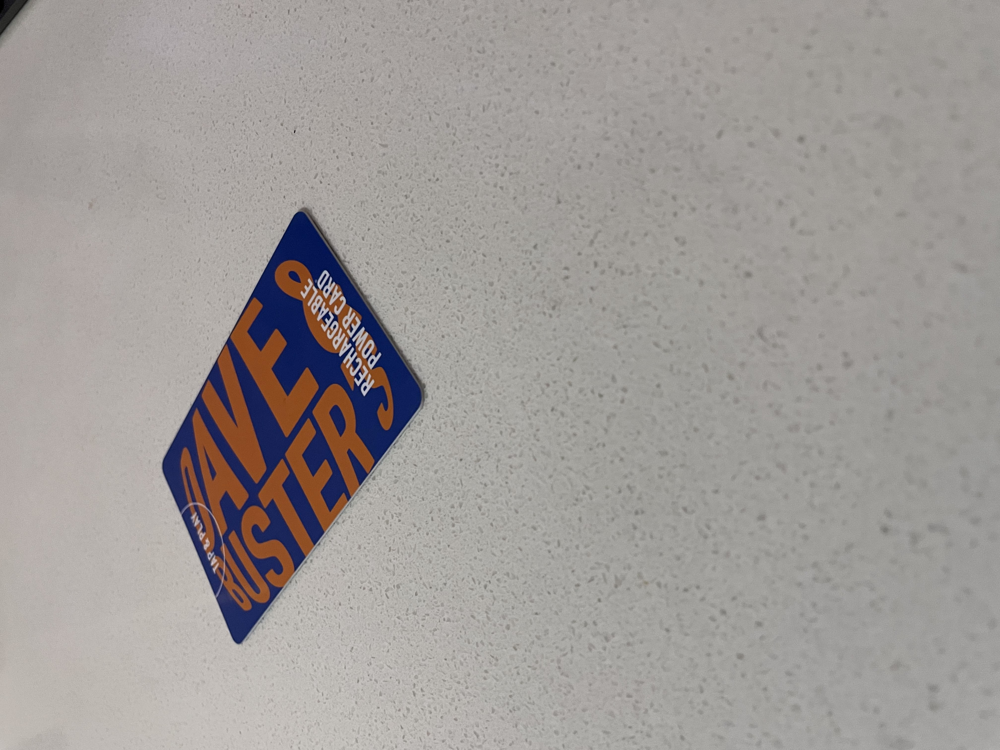

#### Task 2a

In [21]:
pikachu = cv2.imread("task2images/pikachu.jpg")
card1 = cv2.imread("task2images/card1.jpg")
card2 = cv2.imread("task2images/card2.jpg")
card3 = cv2.imread("task2images/card3.jpg")

In [22]:
## The four points on the car
pikachu_points = np.array([[0,0,1], [0,pikachu.shape[1],1], [pikachu.shape[0], pikachu.shape[1], 1], [pikachu.shape[0], 0, 1]])

## The four points on card1
card1_points = np.array([[926,2261,1], [2189,2434,1], [2402,301,1], [1096,206,1]])

## The four points on card2
card2_points = np.array([[881,1130,1], [658,1461,1], [2552,1710,1], [2325,1309,1]])

## The four points on card3
card3_points = np.array([[1147,658,1], [436,959,1], [1422,1706,1], [2168,1208,1]])

In [23]:
H_card1 = compute_homography(card1_points.T, pikachu_points.T)
H_card2 = compute_homography(card2_points.T, pikachu_points.T)
H_card3 = compute_homography(card3_points.T, pikachu_points.T)

In [24]:
transform(card1, pikachu, H_card1, "task2a/card1_transform.jpg")

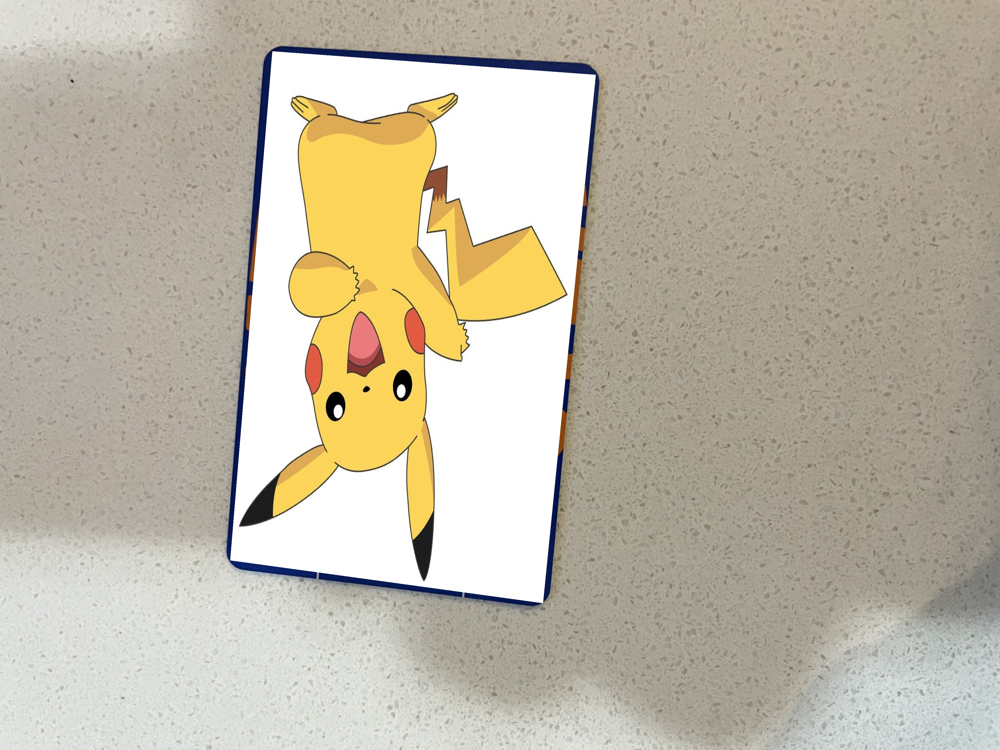

In [25]:
transform(card2, pikachu, H_card2, "task2a/card2_transform.jpg")

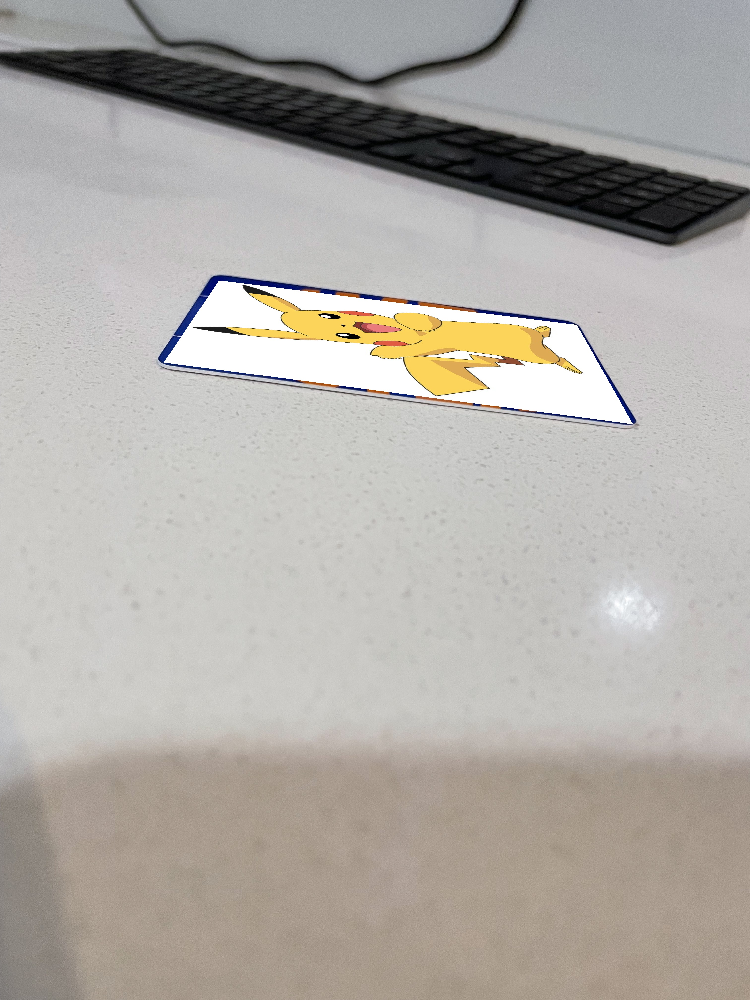

In [26]:
transform(card3, pikachu, H_card3, "task2a/card3_transform.jpg")

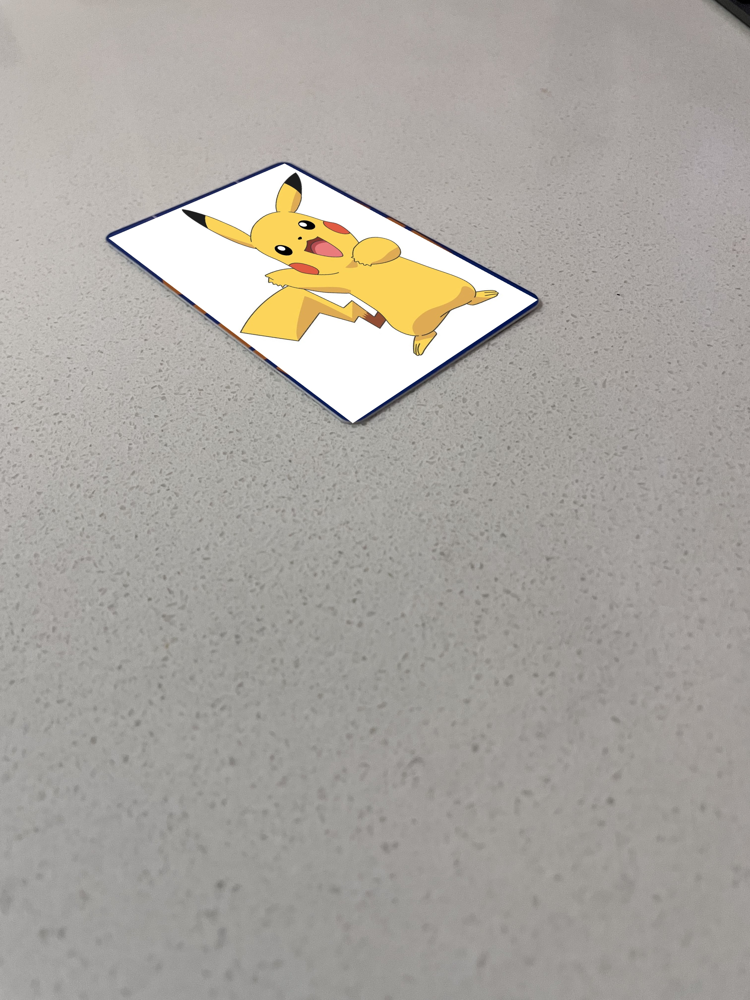

#### Task 2b

In [27]:
pikachu = cv2.imread("task2images/pikachu.jpg")
card1 = cv2.imread("task2images/card1.jpg")
card2 = cv2.imread("task2images/card2.jpg")
card3 = cv2.imread("task2images/card3.jpg")

In [28]:
## The four points on the car
pikachu_points = np.array([[0,0,1], [0,pikachu.shape[1],1], [pikachu.shape[0], pikachu.shape[1], 1], [pikachu.shape[0], 0, 1]])

## The four points on card1
card1_points = np.array([[926,2261,1], [2189,2434,1], [2402,301,1], [1096,206,1]])

## The four points on card2
card2_points = np.array([[881,1130,1], [658,1461,1], [2552,1710,1], [2325,1309,1]])

## The four points on card3
card3_points = np.array([[1147,658,1], [436,959,1], [1422,1706,1], [2168,1208,1]])

In [29]:
H21 = compute_homography(card2_points.T, card1_points.T)
H32 = compute_homography(card3_points.T, card2_points.T)
H32_21 = np.matmul(H32, H21)

In [30]:
blank_image = np.zeros(card3.shape)
transform(blank_image, card1, H32_21, "task2b/card1_transformed.jpg")

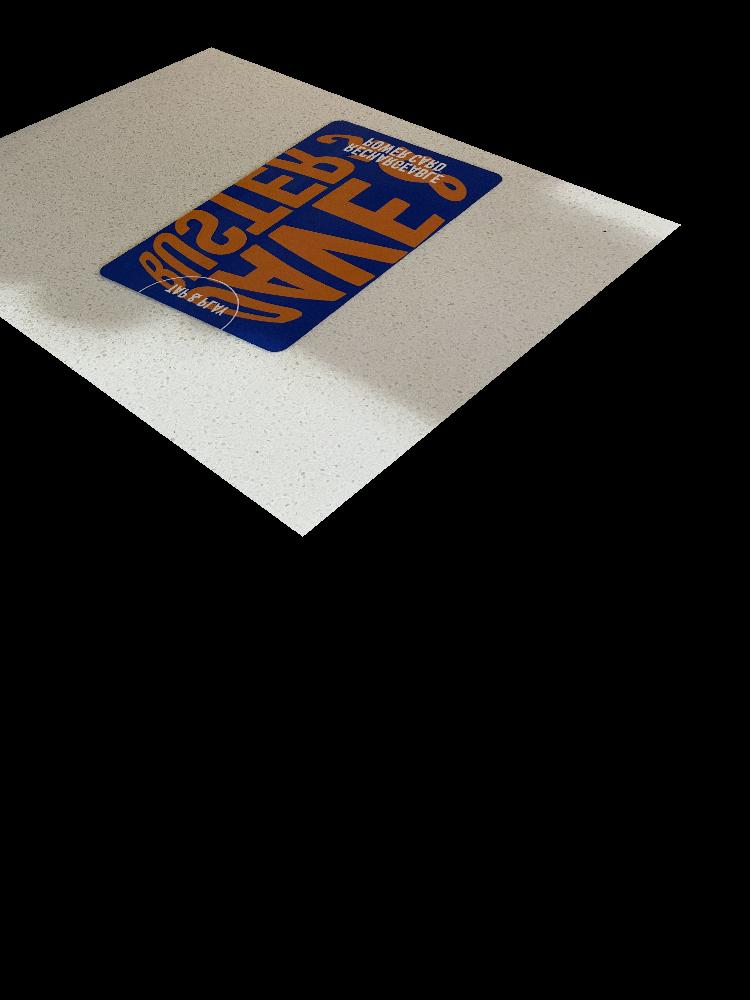

#### Task 2c

In [31]:
pikachu = cv2.imread("task2images/pikachu.jpg")
card1 = cv2.imread("task2images/card1.jpg")
card2 = cv2.imread("task2images/card2.jpg")
card3 = cv2.imread("task2images/card3.jpg")

In [32]:
## The four points on the car
pikachu_points = np.array([[0,0,1], [0,pikachu.shape[1],1], [pikachu.shape[0], pikachu.shape[1], 1]])

## The four points on card1
card1_points = np.array([[926,2261,1], [2189,2434,1], [2402,301,1]])

## The four points on card2
card2_points = np.array([[881,1130,1], [658,1461,1], [2552,1710,1]])

## The four points on card3
card3_points = np.array([[1147,658,1], [436,959,1], [1422,1706,1]])

In [33]:
affine_1 = affine_homography(card1_points, pikachu_points)
affine_2 = affine_homography(card2_points, pikachu_points)
affine_3 = affine_homography(card3_points, pikachu_points)

In [34]:
transform(card1, pikachu, affine_1, "task2c/card1_affine.jpg")

In [35]:
transform(card2, pikachu, affine_2, "task2c/card2_affine.jpg")

In [36]:
transform(card3, pikachu, affine_3, "task2c/card3_affine.jpg")